In [883]:
#MAT 201A Homework5 Intae Hwang
#Source code from 201A class 
#Other reference
#"Visual data processing"
#http://www.slideshare.net/neuralix/ss-35304929

In [885]:
%pylab inline
rcParams['figure.figsize'] = (10, 4)
from __future__ import print_function
from __future__ import division


Populating the interactive namespace from numpy and matplotlib


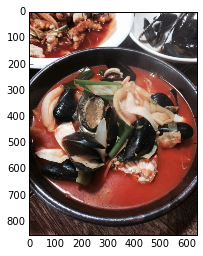

In [887]:
from PIL import Image
from pylab import *
from scipy import signal
from scipy import misc

import matplotlib.pyplot as plt

img = array(Image.open("Photo.jpeg"))
imshow(img)

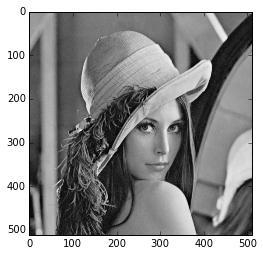

In [889]:
#i = imread('Lenna.png')
from scipy.misc import lena

i = lena()
imshow(i, cmap=cm.gray)

In [891]:
from scipy.signal import convolve2d

In [893]:
kernel = ones((40,40))/20

<matplotlib.colorbar.Colorbar instance at 0x1dc64e200>

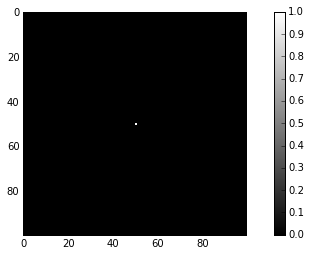

In [895]:
from scipy.signal import convolve2d
mat = zeros((100,100))
mat[50,50] = 1
imshow(mat, cmap=cm.gray, interpolation='nearest')
colorbar()

<matplotlib.colorbar.Colorbar instance at 0x1dcdba560>

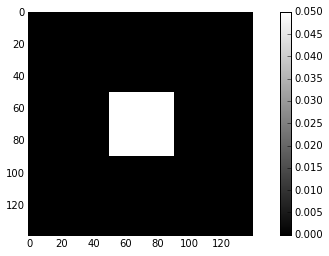

In [897]:
c = convolve2d(mat,kernel)
imshow(c, cmap = cm.gray, interpolation = 'nearest')
colorbar()

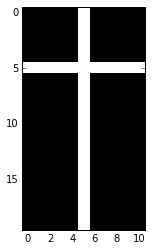

In [899]:
mat = zeros((100,100))
mat[50,50] = 1
kernel = zeros((20,11))
kernel[5, :] = 1
kernel[:, 5] = 1
imshow(kernel, cmap = cm.gray, interpolation = 'nearest')


<matplotlib.colorbar.Colorbar instance at 0x1dd560050>

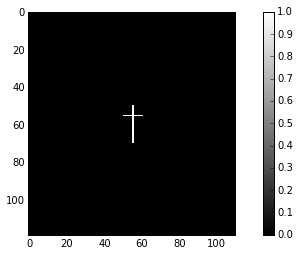

In [901]:
c = convolve2d(mat, kernel)
imshow(c, cmap = cm.gray, interpolation= 'nearest')
colorbar()

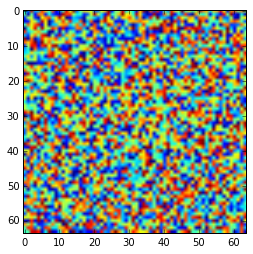

In [903]:
a = np.random.rand(64,64)
imshow(a)


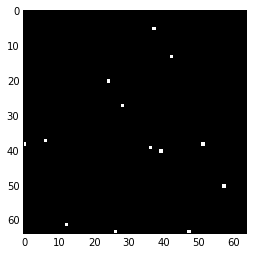

In [905]:
snow = where (a > 0.997, 1, 0)
imshow(snow, cmap= cm.gray, interpolation='nearest')

<matplotlib.colorbar.Colorbar instance at 0x1df0ded40>

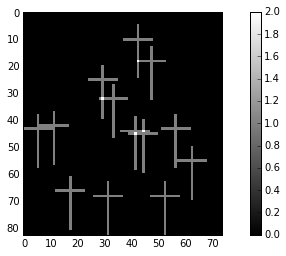

In [907]:
c = convolve2d(snow, kernel)
imshow(c, cmap= cm.gray, interpolation='nearest')
colorbar()

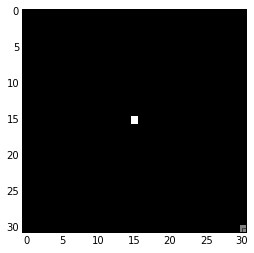

In [909]:
from scipy.ndimage.filters import convolve as convolve2
kernel_ghost = zeros((31, 31))
kernel_ghost[15,15] = 1
kernel_ghost[30,30] = 0.5
imshow(kernel_ghost, cmap = cm.gray, interpolation='nearest')

In [911]:
img.dtype

dtype('uint8')

<matplotlib.colorbar.Colorbar instance at 0x1ce45f638>

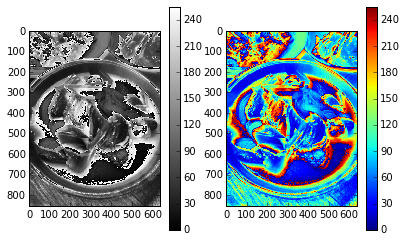

In [913]:
subplot(131)
ghost = convolve2(img[:,:,0], kernel_ghost)
imshow(ghost, cmap=cm.gray, interpolation='nearest')
colorbar()
subplot(132)
ghost = convolve2(img[:,:,0], kernel_ghost)
imshow(ghost, interpolation='nearest')
colorbar()

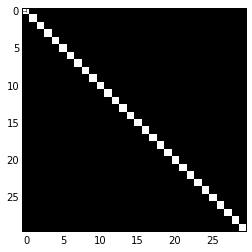

In [915]:
kernel_stamp = zeros((30,30))
kernel_stamp[arange(30), arange(30)] = 1.0
imshow(kernel_stamp, cmap = cm.gray, interpolation='nearest')

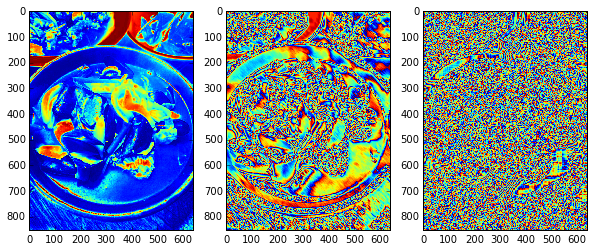

In [917]:
subplot(131)
src_image = img[:,:,2]
imshow(src_image,interpolation='nearest')

subplot(132)
kernel_stamp = zeros((40,40))
kernel_stamp[arange(11), arange(11)] = 1.0
stamp = convolve2(src_image, kernel_stamp)
imshow(stamp, interpolation='nearest')

subplot(133)
kernel_stamp = zeros((40,40))
kernel_stamp[1,:] = 1.0
kernel_stamp[:,1] = 1.0
stamp = convolve2(src_image, kernel_stamp)
imshow(stamp, interpolation='nearest')

<matplotlib.colorbar.Colorbar instance at 0x19d3303f8>

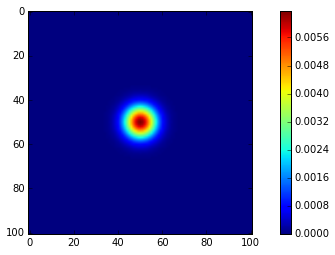

In [919]:
import scipy.ndimage as ndimage
single_dot = zeros((101,101))
single_dot[50,50] = 1.0
#single_dot[70,70] = 1.0
#single_dot[20,40] = 1.0
#single_dot[40,40] = 1.0
gauss_kernel = ndimage.gaussian_filter(single_dot,5)
imshow(gauss_kernel)
colorbar()

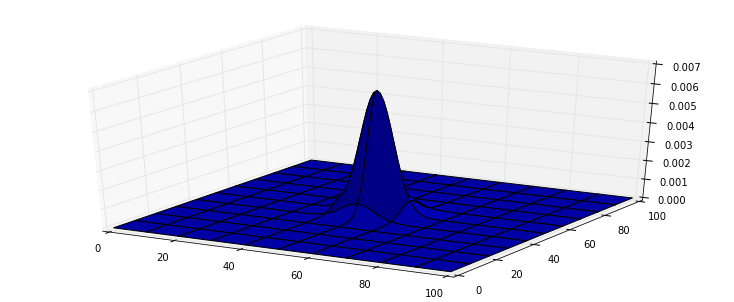

In [921]:
from mpl_toolkits.mplot3d import Axes3D

fig = figure()
ax = Axes3D(fig)
x, y = mgrid[0:101, 0:101]
ax.plot_surface(x,y,gauss_kernel)
fig.add_axes(ax)

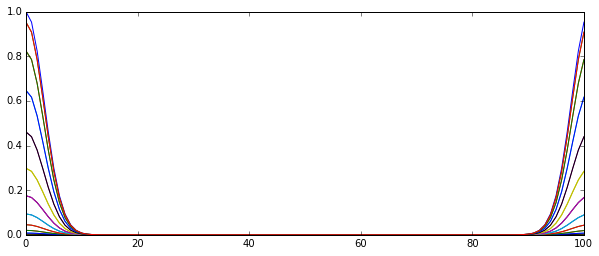

In [923]:
plot(abs(fftpack.fft2(gauss_kernel[:,:])))


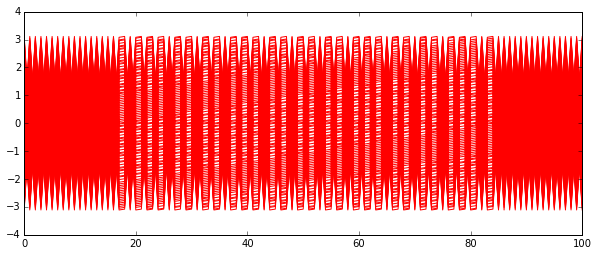

In [925]:
plot(angle(fftpack.fft2(gauss_kernel[:,:])),'r')

(50, 60)

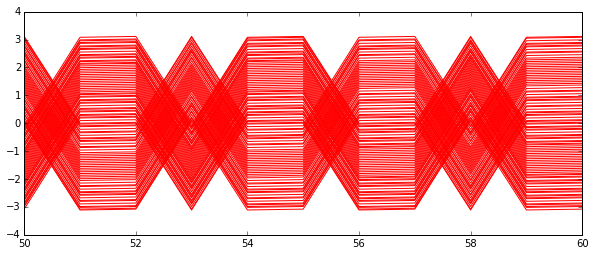

In [927]:
plot(angle(fftpack.fft2(gauss_kernel[:,:])),'r')
xlim(50,60)

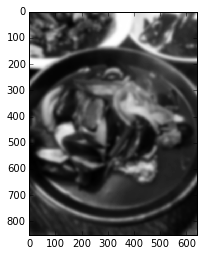

In [929]:
gauss_blur = convolve2(src_image, gauss_kernel)
imshow(gauss_blur, cmap=cm.gray, interpolation= 'nearest')

<matplotlib.colorbar.Colorbar instance at 0x1dfa95320>

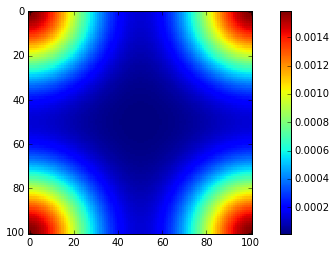

In [931]:
single_dot = zeros((101, 101))
single_dot[0, 0] = 1.0
single_dot[0, 100] = 1.0
single_dot[100, 0] = 1.0
single_dot[100, 100] = 1.0
gauss_kernel = ndimage.gaussian_filter(single_dot, 20)
imshow(gauss_kernel, interpolation='nearest')
colorbar()

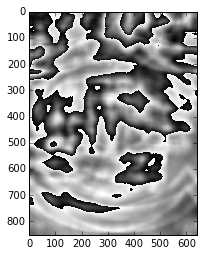

In [933]:
gauss_blur = convolve2(src_image, gauss_kernel)
imshow(gauss_blur, cmap=cm.gray, interpolation= 'nearest')

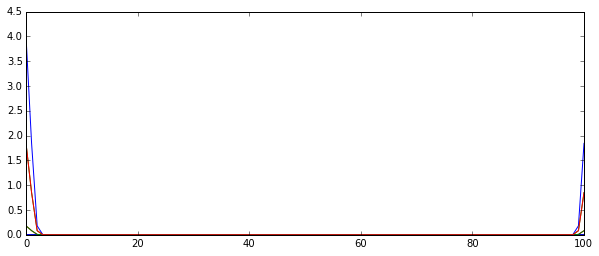

In [935]:
plot(abs(fftpack.fft2(gauss_kernel[:,:])))

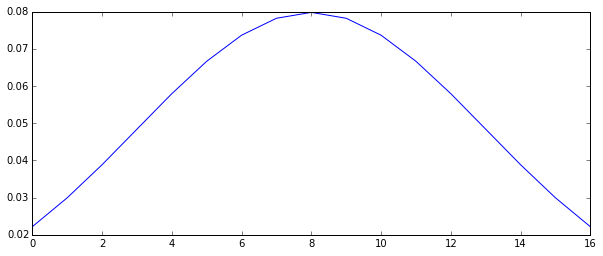

In [937]:
import scipy.stats as stats
gauss = stats.norm.pdf(arange(17), loc=8, scale=5)
plot(gauss)

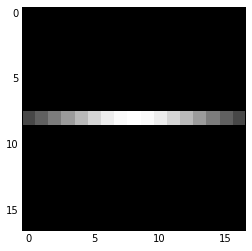

In [939]:
kernel = zeros((17,17))
kernel[8,:] = gauss
imshow(kernel, cmap = cm.gray, interpolation='nearest')

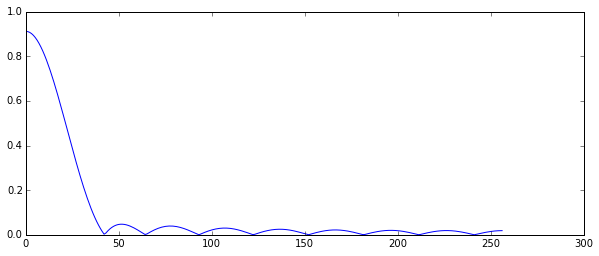

In [941]:
plot(abs(rfft(gauss, 512)))

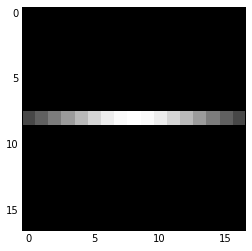

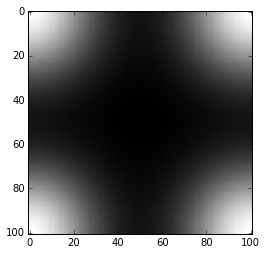

In [943]:
imshow(kernel, interpolation='nearest', cmap=cm.gray)
figure()
imshow(gauss_kernel, interpolation='nearest', cmap=cm.gray)

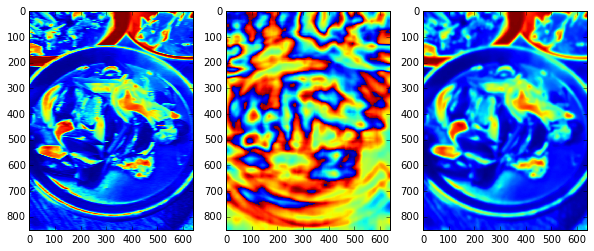

In [945]:
c = convolve2(src_image, kernel)
subplot(131)
imshow(c, interpolation='nearest')

c = convolve2(src_image, gauss_kernel)
subplot(132)
imshow(c, interpolation='nearest')

subplot(133)
imshow(ndimage.gaussian_filter(src_image, 5), interpolation='nearest')

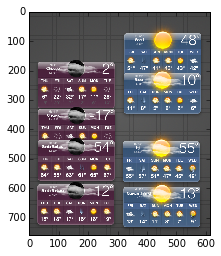

In [947]:
pyt = imread('temp.png')
imshow(pyt, interpolation='nearest')

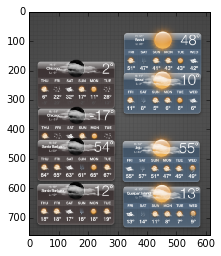

In [949]:
imshow(ndimage.gaussian_filter(pyt, 0.95), interpolation='nearest')

<matplotlib.colorbar.Colorbar instance at 0x1eacd2050>

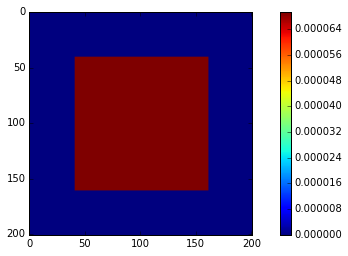

In [951]:
single_dot = zeros((201, 201))
single_dot[100, 100] = 1.0
gauss_kernel = ndimage.uniform_filter(single_dot, 120)
imshow(gauss_kernel)
colorbar()

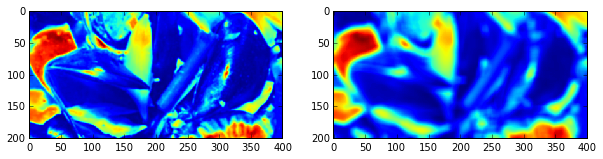

In [953]:
src_image_musell = src_image[400:600, 100:500]
subplot(121)
imshow(ndimage.gaussian_filter(src_image_musell, 1), interpolation='nearest')
subplot(122)
imshow(ndimage.uniform_filter(src_image_musell, 13), interpolation='nearest');

In [955]:
def imshow2(img2):
    imshow(img2, interpolation='nearest')


<matplotlib.colorbar.Colorbar instance at 0x1ebe68488>

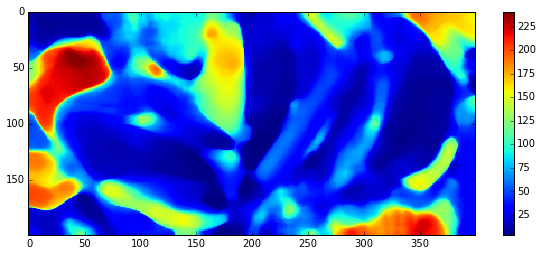

In [957]:
c3 = ndimage.median_filter(src_image_musell, size=15)
imshow2(c3)
colorbar()

In [959]:
from random import*
import random

In [961]:
random.random()

0.21782711767883312

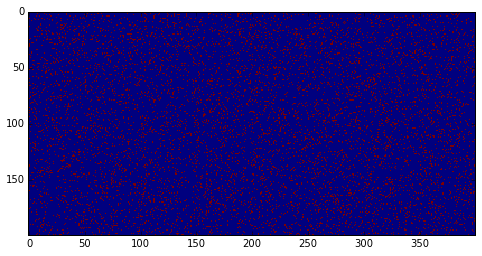

In [963]:
noise = where(np.random.random(src_image_musell.shape)>0.9,0.5,0)
imshow2(noise)

In [965]:
src_image_musell.max(), src_image_musell.dtype

(255, dtype('uint8'))

<matplotlib.colorbar.Colorbar instance at 0x1ed15a128>

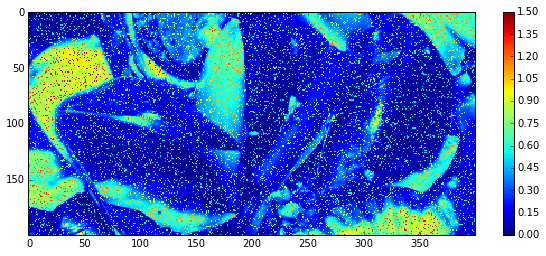

In [967]:
noisy_image = (src_image_musell/255.0) +noise
imshow2(noisy_image)
colorbar()

<matplotlib.colorbar.Colorbar instance at 0x1d6b42fc8>

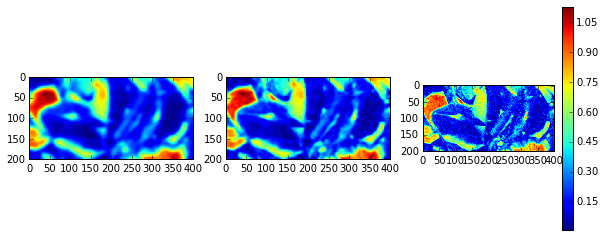

In [969]:
subplot(131)
imshow2(ndimage.gaussian_filter(noisy_image, 5))
subplot(132)
imshow2(ndimage.gaussian_filter(noisy_image, 3))
subplot(133)
imshow2(ndimage.gaussian_filter(noisy_image, 1))
colorbar()

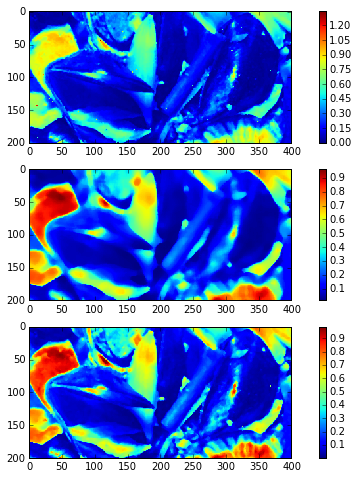

In [971]:
subplot(311)
imshow2(ndimage.median_filter(noisy_image, 3))
colorbar()

subplot(312)
imshow2(ndimage.median_filter(noisy_image, 10))
colorbar()

subplot(313)
imshow2(ndimage.median_filter(noisy_image, 4))
colorbar()
gcf().set_figheight(8)

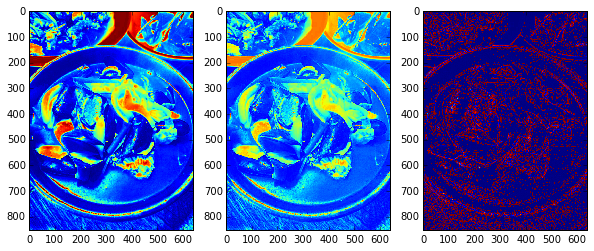

In [973]:
title('Sharpen')
subplot(131)
imshow2(src_image)

subplot(132)
c = ndimage.gaussian_filter(src_image, 1)
c = src_image -c*0.5
imshow2(c)

subplot(133)
c = ndimage.gaussian_filter(src_image, 1)
c = src_image -c
imshow2(c)

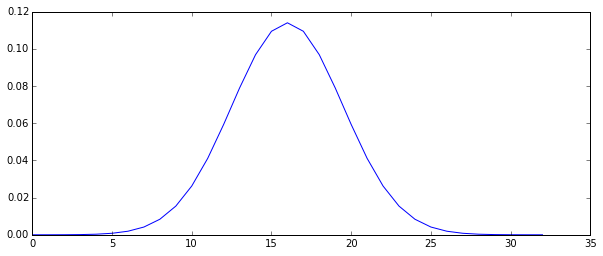

In [975]:
gauss = stats.norm.pdf(arange(33), loc=16, scale=3.5)
plot(gauss)

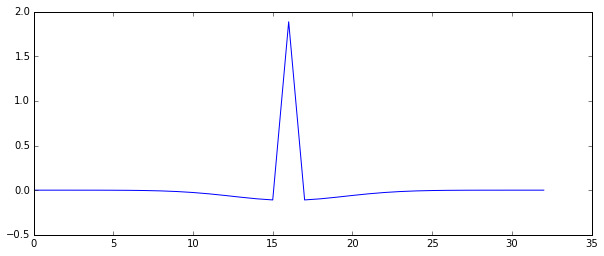

In [977]:
sharpen = zeros(33)
sharpen[16] = 2
sharpen -=gauss
plot(sharpen);

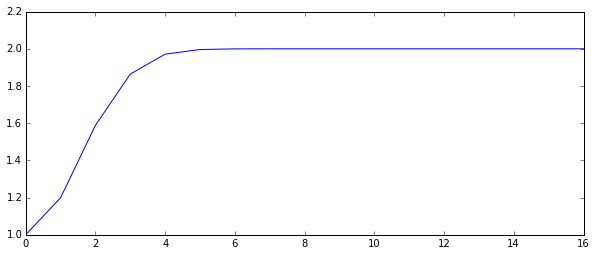

In [979]:
plot(abs(rfft(sharpen)))

In [981]:
img.shape

(852, 640, 3)

<matplotlib.colorbar.Colorbar instance at 0x1f40663f8>

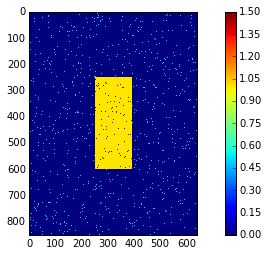

In [983]:
src_image = zeros((852,640))
src_image[250:-250, 250:-250] = 1.0
noise = where(np.random.random(src_image.shape) > 0.98, 0.5, 0)
src_image += noise
imshow2(src_image)
colorbar()

In [985]:
src_image.shape

(852, 640)

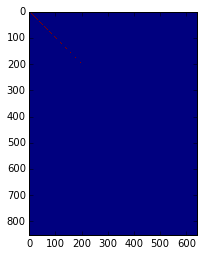

In [987]:
structure = zeros((852,640))
structure[range(300), range(300)] = 1.0 #
imshow2(structure)

In [989]:
structure.shape

(852, 640)

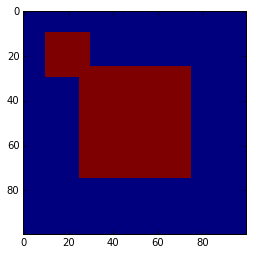

In [991]:
src_image = zeros((100,100))
src_image[25:-25, 25:-25] = 1
src_image[10:30, 10:30] = 1
imshow2(src_image)

In [993]:
from scipy.ndimage.filters import convolve as convolve2

<matplotlib.colorbar.Colorbar instance at 0x1f83fd878>

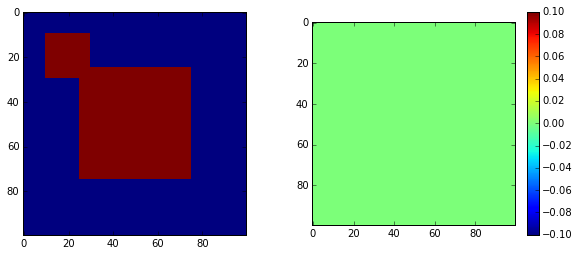

In [995]:
eroded = ndimage.binary_erosion(src_image, structure)
subplot(121)
imshow2(src_image)
subplot(122)
imshow2(eroded)
colorbar()

In [997]:
img.shape

(852, 640, 3)

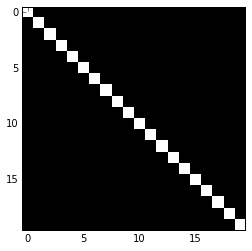

In [999]:
structure1 = zeros((20,20,3))
structure1[range(20), range(20)] = 1.0 #
imshow2(structure1)

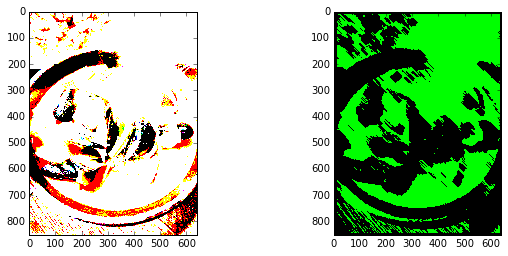

In [1001]:
src_image = where(img[:,:] > 255*0.1, 1, 0)
eroded = ndimage.binary_erosion(src_image, structure1)
subplot(121)
imshow2(src_image)
subplot(122)
imshow2(eroded)

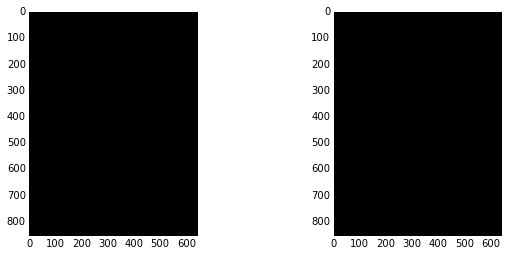

In [1003]:
eroded = ndimage.binary_erosion(eroded, structure1)
subplot(121)
imshow2(eroded)
subplot(122)
eroded = ndimage.binary_erosion(eroded, structure1)
imshow2(eroded)

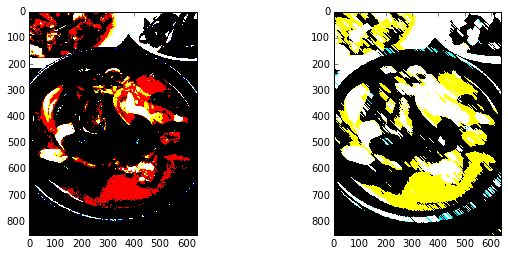

In [1005]:
src_image = where(img > 255 * 0.7, 1, 0)
dilated = ndimage.binary_dilation(src_image, structure1)
subplot(121)
imshow2(src_image)
subplot(122)
imshow2(dilated)

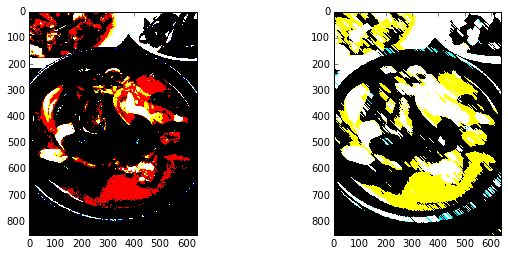

In [1007]:
src_image = where(img > 255 * 0.7, 1, 0)
structure1 = fliplr(structure1)
dilated = ndimage.binary_dilation(src_image, structure1)
subplot(121)
imshow2(src_image)
subplot(122)
imshow2(dilated)

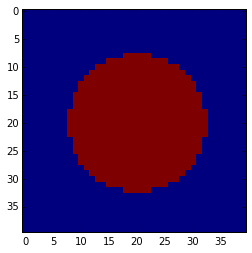

In [1009]:
src_image = where(img > 255 * 0.7, 1, 0)
g = mgrid[-20:20, -20:20]
structure3 = where(sum(g**2, axis=0) < 150, 1,0)
imshow2(structure3)

In [1011]:
structure3.shape

(40, 40)

In [1013]:
structure4 = ndarray.squeeze(structure3)

In [1015]:
structure4.shape

(40, 40)

In [1017]:
structure3.shape

(40, 40)

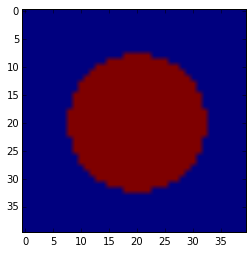

In [1019]:
imshow(structure3)

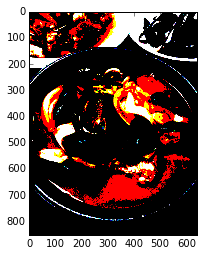

In [1021]:
imshow(src_image)

In [1023]:
src_image.shape

(852, 640, 3)

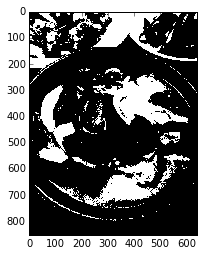

In [1025]:
ghost1 = convolve2(src_image[:,:,0], kernel_ghost)
imshow(ghost1, cmap=cm.gray, interpolation='nearest')

In [1027]:
ghost1.shape

(852, 640)

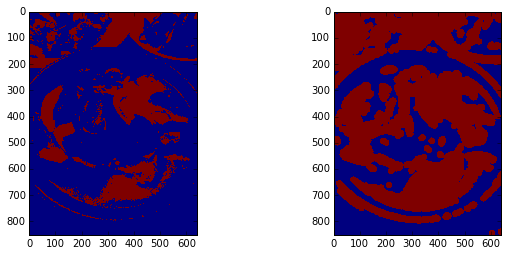

In [1029]:
dilated = ndimage.binary_dilation(ghost1, structure3)
subplot(121)
imshow2(ghost1)
subplot(122)
imshow2(dilated)

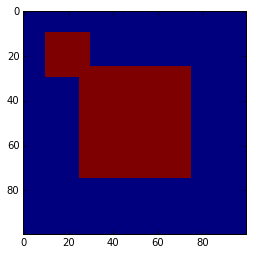

In [1031]:
src_image = zeros((100,100))
src_image[25:-25, 25:-25] = 1
src_image[10:30, 10:30] = 1
imshow2(src_image)

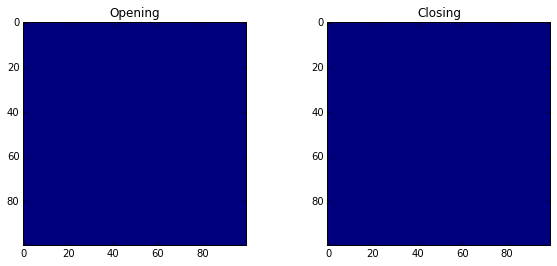

In [1033]:
subplot(121)
imshow2(ndimage.binary_opening(src_image, structure))
title("Opening")
subplot(122)
imshow2(ndimage.binary_closing(src_image, structure))
title("Closing")

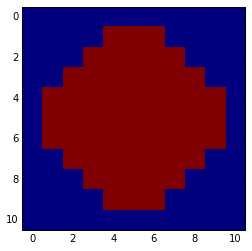

In [1035]:
g = mgrid[-5:6, -5:6]
structure = where(sum(g**2, axis=0) < 18, 1, 0)
imshow2(structure)

In [1037]:
structure.shape

(11, 11)

In [1039]:
ghost3.shape

(852, 640)

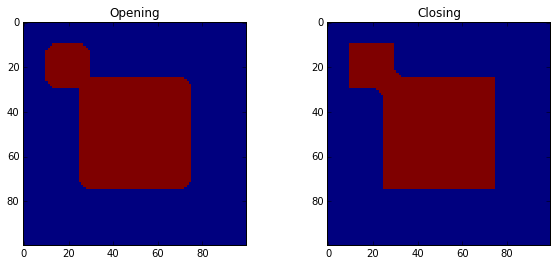

In [1041]:
subplot(121)
imshow2(ndimage.binary_opening(src_image, structure))
title("Opening")
subplot(122)
imshow2(ndimage.binary_closing(src_image, structure))
title("Closing")

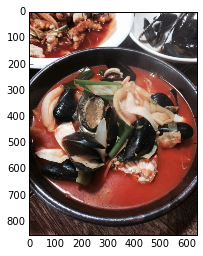

In [1043]:
imshow(img)

(852, 640, 3)

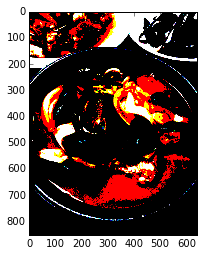

In [1045]:
src_image = where(img > 255 * 0.7, 1, 0)
imshow(src_image)
src_image.shape

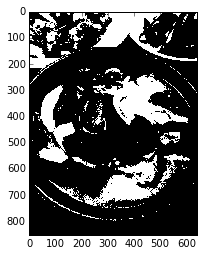

In [1047]:
ghost3 = convolve2(src_image[:,:,0], kernel_ghost)
imshow(ghost3, cmap=cm.gray, interpolation='nearest')

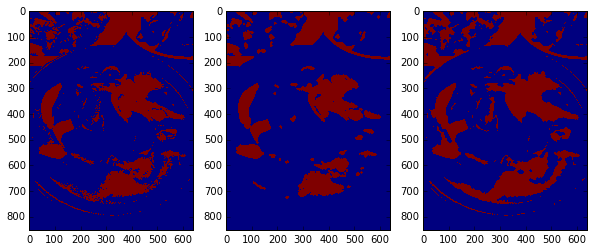

In [1049]:
subplot(131)
imshow2(ghost3)
subplot(132)
imshow2(ndimage.binary_opening(ghost3, structure))
subplot(133)
imshow2(ndimage.binary_closing(ghost3, structure))
gcf().set_figwidth(10)

In [1051]:
ibwlena = lena()
ibwlena.shape

(512, 512)

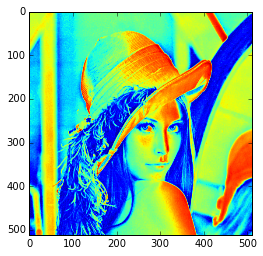

In [1053]:
imshow(ibwlena)

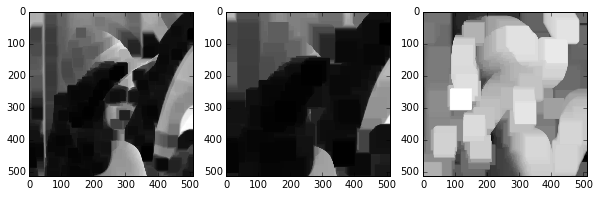

In [1055]:
subplot(131)
min_filter = ndimage.minimum_filter(ibwlena, (30,30))
imshow(min_filter, cmap=cm.gray)

subplot(132)
min_filter = ndimage.minimum_filter(ibwlena, (64,64))
imshow(min_filter, cmap=cm.gray)

subplot(133)
max_filter = ndimage.maximum_filter(ibwlena, (64,64))
imshow(max_filter, cmap=cm.gray)

In [1057]:
mAp = imread("map.png")

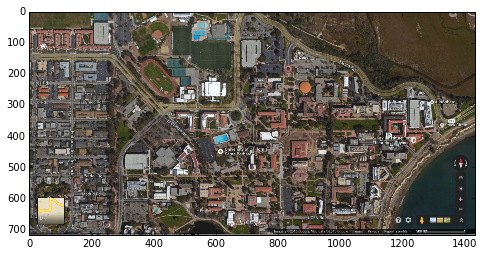

In [1059]:
imshow(mAp,cmap=cm.gray)

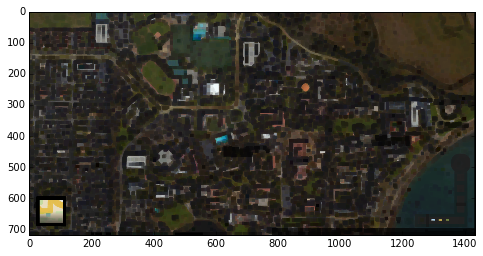

In [1061]:
min_filter = ndimage.minimum_filter(mAp, (10,10,1))
imshow(min_filter)

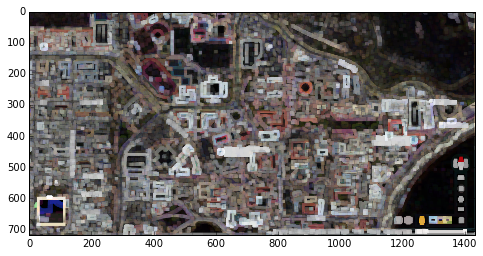

In [1063]:
max_filter = ndimage.maximum_filter(mAp, (10,10,1))
imshow(max_filter - min_filter)

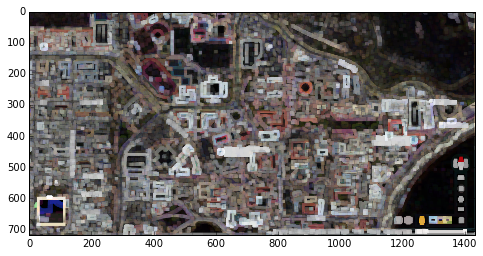

In [1065]:
imshow(max_filter - min_filter)

In [1067]:
import scipy.ndimage.morphology as morphology

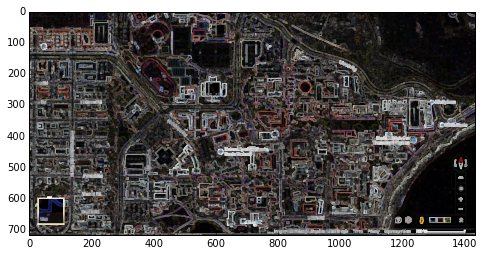

In [1069]:
mg = morphology.morphological_gradient(mAp, (5,5,1))
imshow(mg)

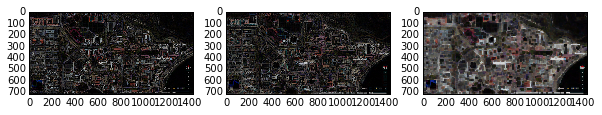

In [1071]:
subplot(131)
wtp = morphology.white_tophat(mAp, (15,15,1))
imshow(wtp);
subplot(132)
btp = morphology.black_tophat(mAp, (15,15,1))
imshow(btp);
subplot(133)
imshow(btp + wtp);

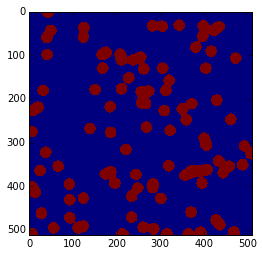

In [1073]:
n = 100
l = 512
im = np.zeros((512,512))
points = l*np.random.random((3, n))
im[(points[0]).astype(np.int), (points[1]).astype(np.int)] = 1
im = ndimage.gaussian_filter(im, 6)
im = where(im > im.mean(), 1, 0)
imshow2(im)

In [1075]:
label_im, nb_labels = ndimage.label(im)
print(nb_labels) 

62


<matplotlib.colorbar.Colorbar instance at 0x231e38830>

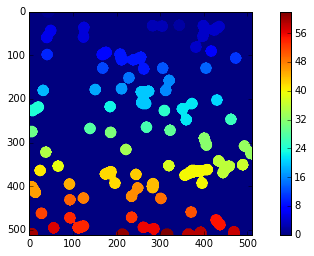

In [1077]:
imshow(label_im)
colorbar()

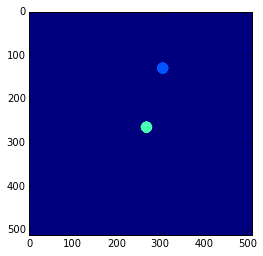

In [1079]:
blob = where(label_im == 13, 13, 0)
blob += where(label_im == 27, 27, 0)
imshow(blob, vmax= nb_labels)

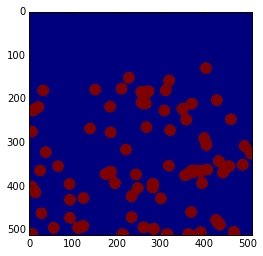

In [1081]:
blobs = where(label_im > 13, 1, 0)
imshow(blobs)

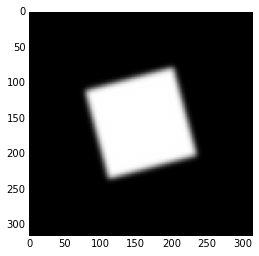

In [1083]:
im = np.zeros((256,256,3))
im[64:-64, 64:-64] = 1
im = ndimage.rotate(im, 15, mode='constant')
im = ndimage.gaussian_filter(im, 4)
imshow2(im)

<matplotlib.colorbar.Colorbar instance at 0x235137950>

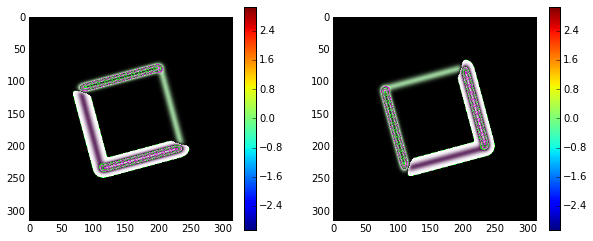

In [1085]:
sx = ndimage.sobel(im, axis=0, mode='constant')
sy = ndimage.sobel(im, axis=1, mode='constant')
subplot(121)
imshow(sx)
colorbar()
subplot(122)
imshow(sy)
gcf().set_figwidth(10)
colorbar()

<matplotlib.colorbar.Colorbar instance at 0x230bf38c0>

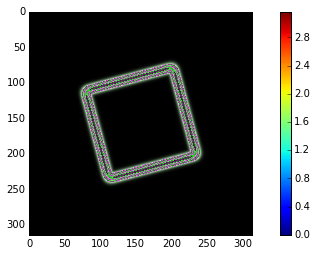

In [1087]:
sob = hypot(sx, sy)
imshow(sob)
colorbar()

<matplotlib.colorbar.Colorbar instance at 0x214841f80>

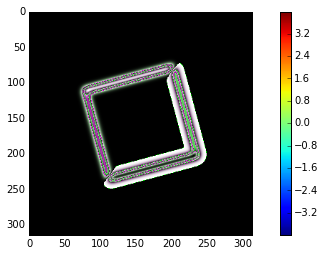

In [1089]:
sob = sx + sy
imshow(sob)
colorbar()

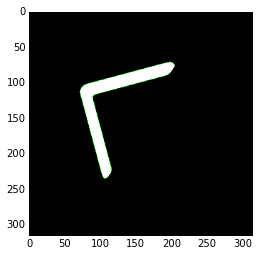

In [1091]:
imshow(sob > 0.33)

In [1093]:
src_mat= zeros((3, 3, 3))
src_mat[1,1,1] = 1
print(ndimage.sobel(src_mat, axis=0))
print(ndimage.sobel(src_mat, axis=1))

[[[ 1.  2.  1.]
  [ 2.  4.  2.]
  [ 1.  2.  1.]]

 [[ 0.  0.  0.]
  [ 0.  0.  0.]
  [ 0.  0.  0.]]

 [[-1. -2. -1.]
  [-2. -4. -2.]
  [-1. -2. -1.]]]
[[[ 1.  2.  1.]
  [ 0.  0.  0.]
  [-1. -2. -1.]]

 [[ 2.  4.  2.]
  [ 0.  0.  0.]
  [-2. -4. -2.]]

 [[ 1.  2.  1.]
  [ 0.  0.  0.]
  [-1. -2. -1.]]]


<matplotlib.colorbar.Colorbar instance at 0x20da60830>

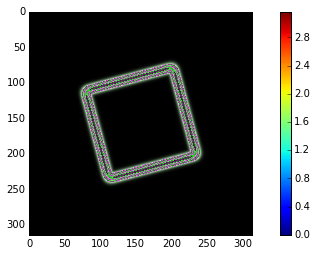

In [1095]:
pre = hypot(sx, sy)
imshow(pre)
colorbar()

In [1097]:
src_mat= zeros((5, 5, 5))
src_mat[2,2,2] = 1
print(ndimage.sobel(src_mat, axis=0))
print(ndimage.sobel(src_mat, axis=1))
print("-----")
src_mat= zeros((5, 5, 5))
src_mat[2,2] = 1
print(ndimage.prewitt(src_mat, axis=0))
print(ndimage.prewitt(src_mat, axis=1))

[[[ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.]
  [ 0.  1.  2.  1.  0.]
  [ 0.  2.  4.  2.  0.]
  [ 0.  1.  2.  1.  0.]
  [ 0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.]
  [ 0. -1. -2. -1.  0.]
  [ 0. -2. -4. -2.  0.]
  [ 0. -1. -2. -1.  0.]
  [ 0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]]]
[[[ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.]
  [ 0.  1.  2.  1.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0. -1. -2. -1.  0.]
  [ 0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.]
  [ 0.  2.  4.  2.  0.]
  [ 0.  0.  0.  0.  0.]
  [ 0. -2. -4. -2.  0.]
  [ 0.  0.  0.  0.  0.]]

 [[ 0.  0.  0.  0.  0.]


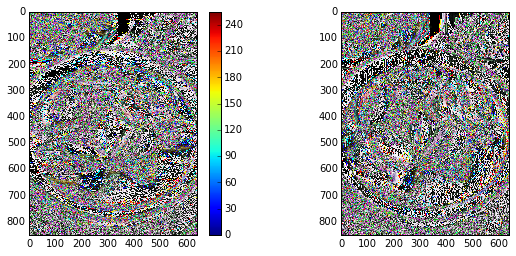

In [1099]:
src_image = img
sx = ndimage.sobel(src_image, axis=0, mode='constant')
sy = ndimage.sobel(src_image, axis=1, mode='constant')
subplot(121)
imshow2(sx)
colorbar()
subplot(122)
imshow2(sy)

<matplotlib.colorbar.Colorbar instance at 0x1f8436128>

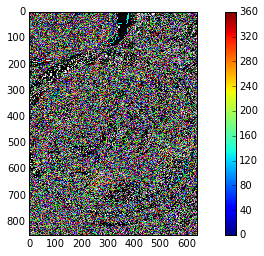

In [1101]:
sob = hypot(sx, sy)
imshow2(sob)
colorbar()

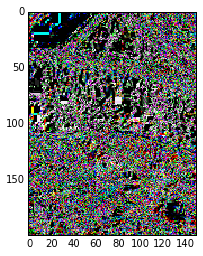

In [1103]:
imshow2(sob[100:300, 300:450])

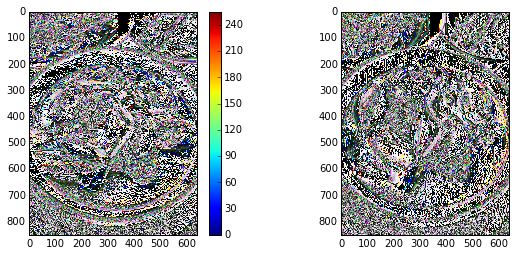

In [1105]:
src_image = img
sx = ndimage.prewitt(src_image, axis=0, mode='constant')
sy = ndimage.prewitt(src_image, axis=1, mode='constant')
subplot(121)
imshow2(sx)
colorbar()
subplot(122)
imshow2(sy)

<matplotlib.colorbar.Colorbar instance at 0x1d9b8e6c8>

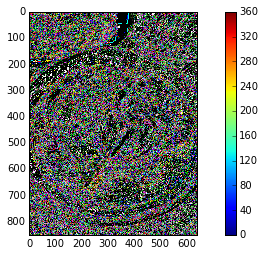

In [1107]:
pre = hypot(sx, sy)
imshow2(pre)
colorbar()

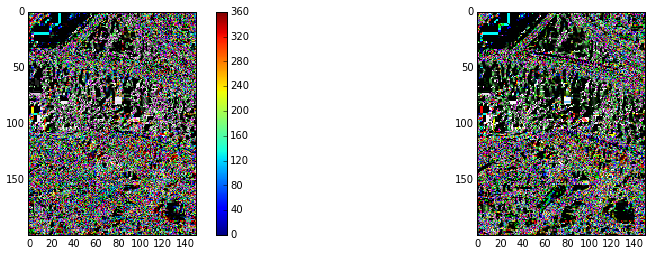

In [1109]:
subplot(121)
imshow2(sob[100:300, 300:450])
colorbar()
subplot(122)
imshow2(pre[100:300, 300:450])
gcf().set_figwidth(16)

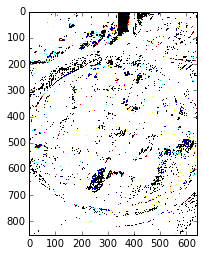

In [1111]:
src_image = sob
filtered = ndimage.median_filter((src_image > 255 * 0.5), 4)
imshow2(filtered)

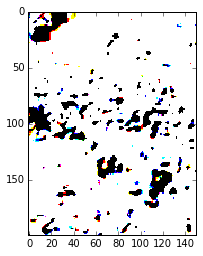

In [1113]:
src_image = sob[100:300, 300:450]
filtered = ndimage.median_filter((src_image > 255 * 0.5), 4)
imshow2(filtered)

In [1115]:
def warp(a, b):
    if a < b:
        out = a + b
    else:
        out = a - b
    return out

vfunc = vectorize(warp)

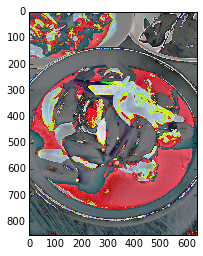

In [1117]:
src_image = img
warped = vfunc(src_image, 127)
imshow(warped, cmap=cm.gray)

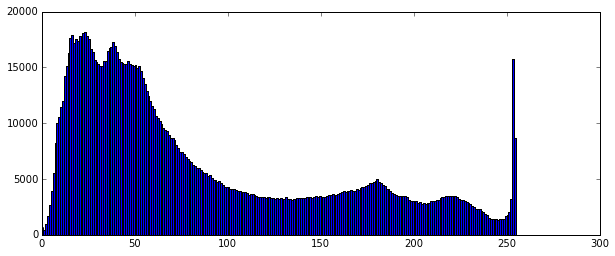

In [1119]:
hist(src_image.flat, bins=255);

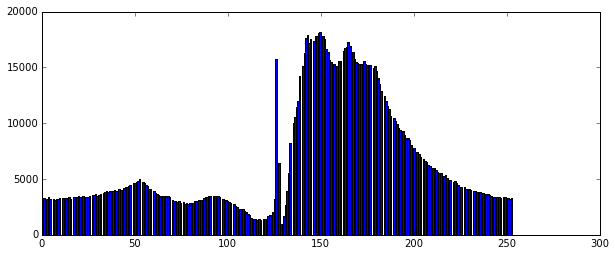

In [1121]:
hist(warped.flat, bins=300);

In [1123]:
img.dtype

dtype('uint8')

In [1125]:
def expand(pixel, center, factor):
    centered = float(pixel) - center
    out = (centered*factor) + center
    if out > 255:
        out = 255
    if out < 0:
        out = 0
    return uint8(out)
    
vfunc = vectorize(expand)

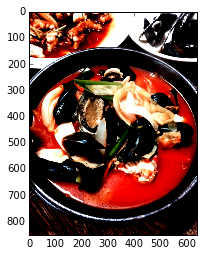

In [1127]:
expanded = vfunc(img, 128, 2.0)
imshow(expanded)

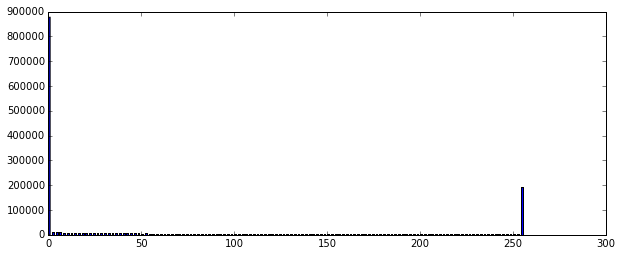

In [1129]:
hist(expanded.flat, bins=255);

(0, 10000)

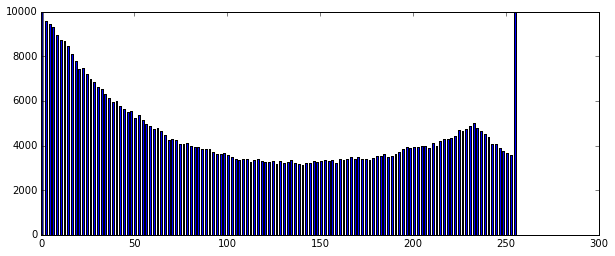

In [1131]:
hist(expanded.flat, bins=255);
ylim((0, 10000))

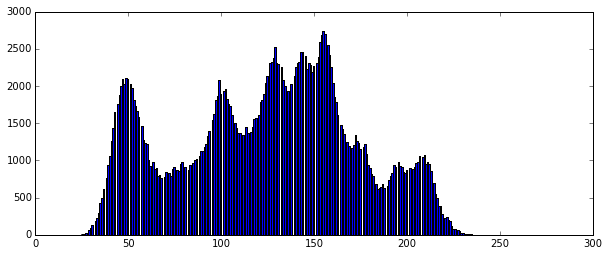

In [1133]:
hist(i.flat, bins=255);
xlim((0, 300));

<matplotlib.colorbar.Colorbar instance at 0x22c7d2bd8>

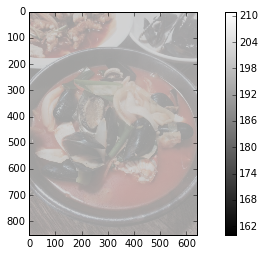

In [1135]:
compressed = vfunc(img, 200, 0.2)
imshow(compressed, cmap=cm.gray)
colorbar()

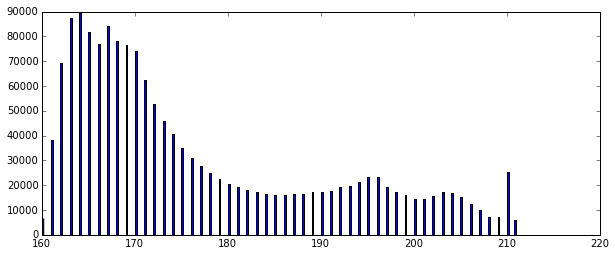

In [1137]:
hist(compressed.flat, bins=255);

<matplotlib.colorbar.Colorbar instance at 0x1f6571b90>

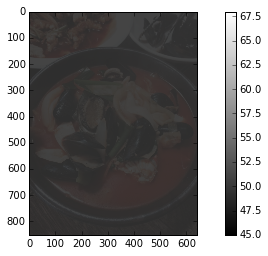

In [1139]:
compressed = vfunc(img, 50, 0.09)
imshow(compressed, cmap=cm.gray)
colorbar()

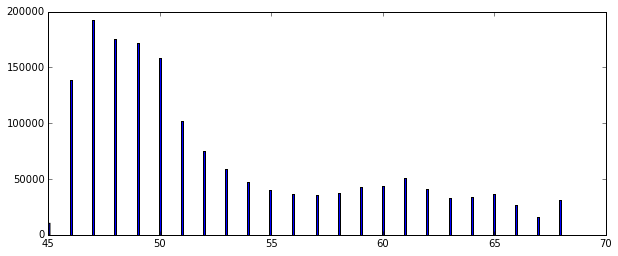

In [1141]:
hist(compressed.flat, bins=255);

In [1143]:
#Picture refernce - http://blog.naver.com/PostView.nhn?blogId=yang713&logNo=120176474446

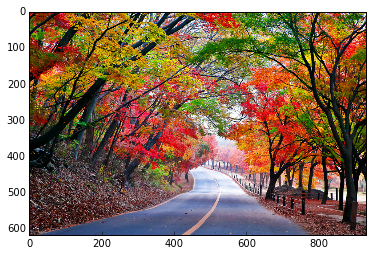

In [1145]:
from skimage import color
tree = imread('maple.jpg')
img_hsv = color.rgb2hsv(tree)
imshow(tree)

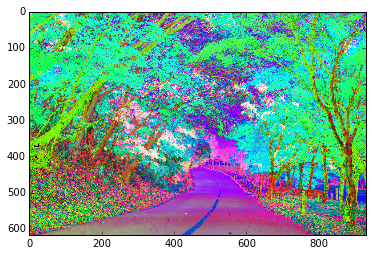

In [1147]:
imshow(img_hsv)

<matplotlib.colorbar.Colorbar instance at 0x1f9dadf38>

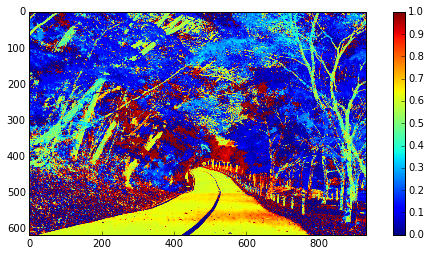

In [1149]:
imshow(img_hsv[:,:, 0])
colorbar()

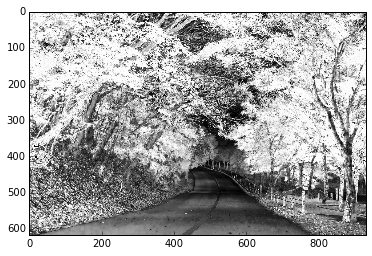

In [1151]:
imshow(img_hsv[:,:, 1], cmap= cm.gray)

In [1153]:
img_hsv.dtype

dtype('float64')

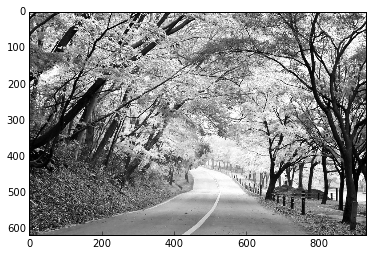

In [1155]:
imshow(img_hsv[:,:, 2], cmap= cm.gray)

In [1157]:
img_hsv[:,:,0].max()

0.9993386243386243

In [1159]:
img_hsv.shape

(617, 930, 3)

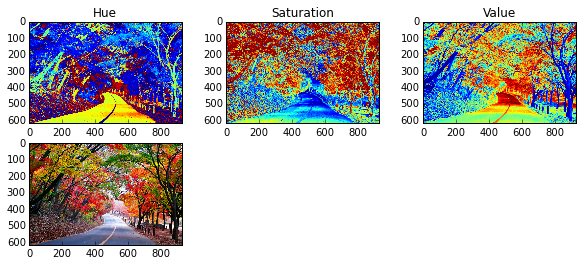

In [1161]:
subplot(231)
title("Hue")
imshow(img_hsv[:,:,0])
subplot(232)
title("Saturation")
imshow(img_hsv[:,:,1])
subplot(233)
title("Value")
imshow(img_hsv[:,:,2])

subplot(234)
imshow(tree)

In [1163]:
FFT = numpy.fft.fft2(mAp)
FFT_centered = numpy.fft.fftshift(FFT)
mag_spec = abs(FFT_centered)
phs_spec = angle(FFT_centered)

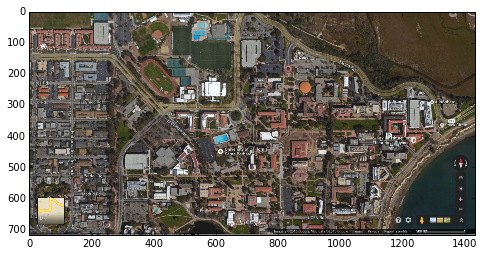

In [1165]:
imshow(mAp)

<matplotlib.colorbar.Colorbar instance at 0x1eb463710>

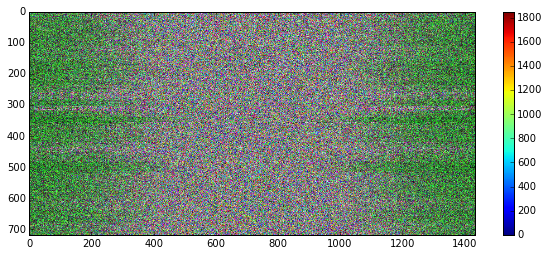

In [1167]:
imshow(mag_spec)
colorbar()

<matplotlib.colorbar.Colorbar instance at 0x1f4fb7320>

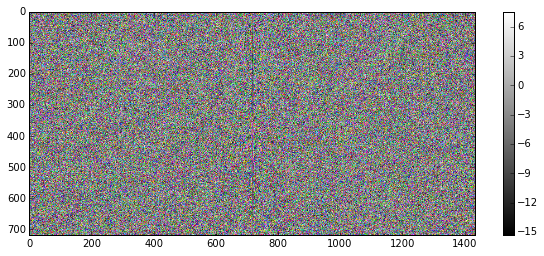

In [1169]:
imshow(log(mag_spec), cmap=cm.gray)
colorbar()

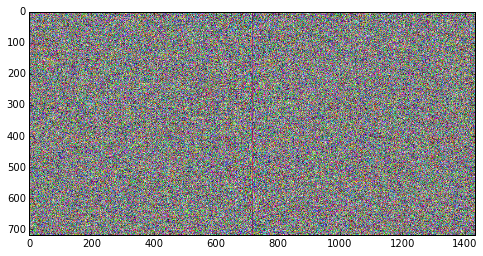

In [1171]:
imshow(phs_spec, cmap=cm.gray)

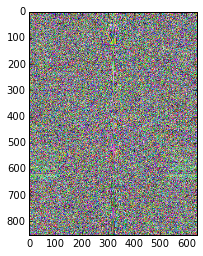

In [1173]:
FFT = numpy.fft.fft2(img)

FFT_centered = numpy.fft.fftshift(FFT)
    
mag_spec = abs(FFT_centered)
phs_spec = angle(FFT_centered)

imshow(log(mag_spec), cmap=cm.gray)

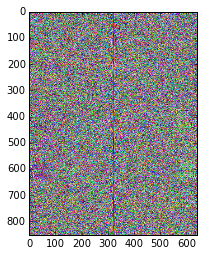

In [1175]:
imshow(phs_spec, cmap=cm.gray)

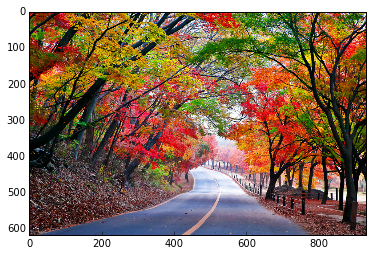

In [1177]:
imshow(tree)

In [1179]:
tree.shape

(617, 930, 3)

<matplotlib.colorbar.Colorbar instance at 0x211244830>

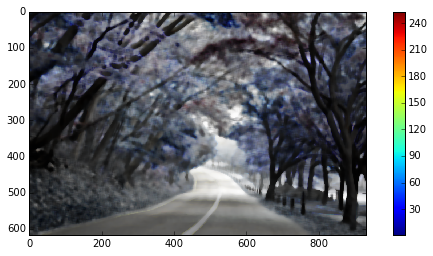

In [1231]:
def imshow3(tree):
    imshow(tree, interpolation='nearest')
    
c3 = ndimage.median_filter(tree, size=10)
imshow2(c3)
colorbar()

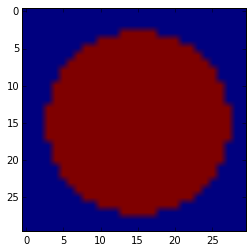

In [1212]:
src_image = where(tree > 255 * 0.9, 1, 0)
g = mgrid[-15:15, -15:15]
structure = where(sum(g**2, axis=0) < 150, 1, 0)
imshow(structure)

In [1213]:
size(structure)

900

In [1214]:
structure.shape

(30, 30)

In [1215]:
structure.dtype

dtype('int64')

(0, 10)

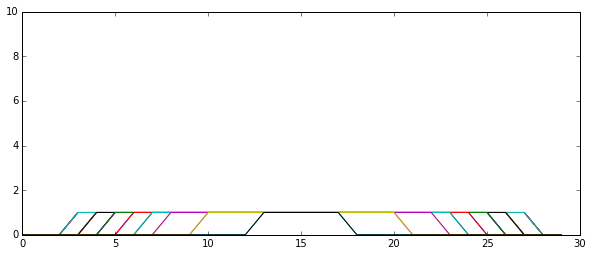

In [1216]:
plot(structure)
ylim(0,10)

In [1217]:
array(structure)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [1218]:
structure = structure[:,:, newaxis]

In [1219]:
structure.shape

(30, 30, 1)

In [1220]:
a = ((1,1,3))

In [1221]:
array(a)

array([1, 1, 3])

In [1222]:
structure = structure * a 

In [1223]:
structure.shape

(30, 30, 3)

In [1224]:
array(structure)

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ..., 
       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ..., 
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]])

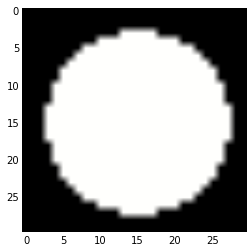

In [1229]:
imshow(structure)

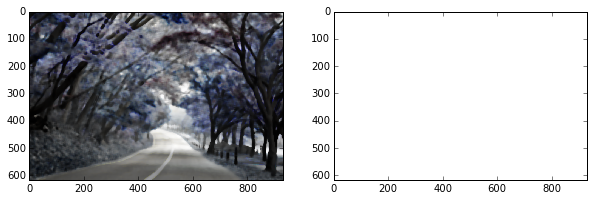

In [1232]:
dilated = ndimage.binary_dilation(c3, structure)
subplot(121)
imshow2(c3)
subplot(122)
imshow2(dilated)

<matplotlib.colorbar.Colorbar instance at 0x1ede01b90>

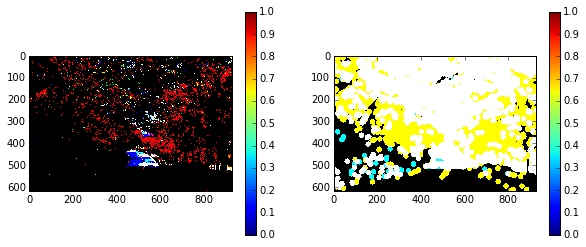

In [1234]:
dilated = ndimage.binary_dilation(src_image, structure)
subplot(121)
imshow2(src_image)
colorbar()
subplot(122)
imshow2(dilated)
colorbar()